In [613]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
import re
import os
import codecs
import pandas as pd
import html2text
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from textblob import TextBlob
from nltk.corpus import stopwords
from wordcloud import WordCloud
import seaborn

Data loading and cleaning

In [614]:
def load_clean_joke():

    ret_jokes = []

    for i in range(1,101):
        file = 'init'+str(i)+'.html'
        data = codecs.open('jokes/' + file, 'r', encoding="cp1252")
        joke_html = data.read()

        # Extracting joke
        joke = html2text.html2text(joke_html)
        # Extracting joke_id
        joke_id = int(file.split('init')[1].split('.html')[0])
        cleaned_string = re.sub(r'[\|]+|[-]+', '', joke)

        ret_jokes.append(cleaned_string.strip())
    
    return ret_jokes


In [615]:
Jokes = load_clean_joke()

In [616]:
jokes_dataframe = pd.DataFrame()
jokes_dataframe["Original Jokes"] = Jokes

In [617]:
from nltk.corpus import stopwords

def remove_tags_puntuatuions_tags(Joke):
    special_char_patterns = r'[^a-zA-Z0-9\s]'
    urlPatterns = r'http\S+|www\S+'

    text = Joke

    text = re.sub(special_char_patterns, ' ', text)
    text = re.sub(urlPatterns, ' ', text)
    text = re.sub(r'\n', ' ', text)

    return text

def remove_stop_words_Tokenization(Joke):
    
    stopwords_ = set(stopwords.words('english'))
    Tokenize_Joke = []
    for word in Joke.split():
        if word not in stopwords_:
            Tokenize_Joke.append(word)

    return Tokenize_Joke

def lower(Joke):
    ret_lst = [word.lower() for word in Joke]
    return ret_lst

def preprocess_clean_jokes(uncleaned_Jokes):

    Cleaned_Jokes = []

    for Joke in uncleaned_Jokes:
        # Remove puntuations and tags from the data
        Joke = remove_tags_puntuatuions_tags(Joke)
        # Correct Spelling
        Joke = TextBlob(Joke)
        # Remove Stop Words and do Tokenization of Joke
        Joke = remove_stop_words_Tokenization(Joke)

        Cleaned_Jokes.append(lower(Joke))

    return Cleaned_Jokes



In [618]:
preprocessed_jokes = preprocess_clean_jokes(Jokes)

In [619]:
jokes_dataframe["PreProcessed Jokes"] = preprocessed_jokes

In [620]:
jokes_dataframe["Original Jokes"] = Jokes

In [621]:
dataset1 = pd.read_excel("jester-data-1.xls")
dataset2 = pd.read_excel("jester-data-2.xls")
dataset3 = pd.read_excel("jester-data-3.xls")

In [622]:
def insert_return(frame):
    ret_lst = []
    for index,row in frame.iterrows():
        ret_lst.append(list(row))
    
    return ret_lst

def combine_dataframe(frame1, frame2, frame3):
    joke_lst = ["Number of jokes rated"]
    for i in range(100):
        joke_lst.append(f"joke-{i}")

    rating_lst = []

    rating_lst.extend(insert_return(frame1))
    rating_lst.extend(insert_return(frame2))
    rating_lst.extend(insert_return(frame3))

    return pd.DataFrame(data=rating_lst,columns=joke_lst)


In [623]:
dataframe = combine_dataframe(dataset1, dataset2,dataset3)

In [624]:
dataframe = dataframe.replace(99,np.nan)

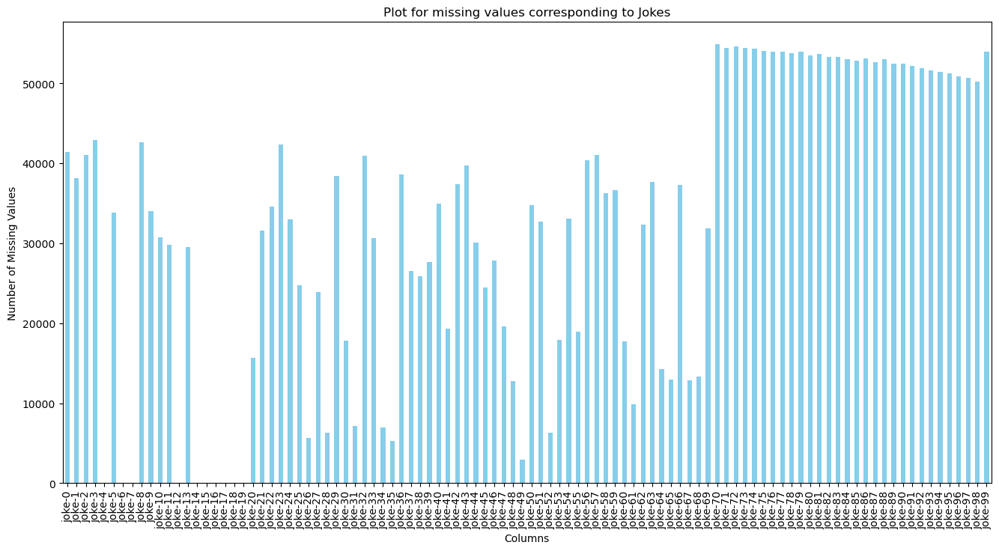

In [625]:
df = dataframe.drop(columns=["Number of jokes rated"])

missing_values = df.isnull().sum()

plt.figure(figsize=(16, 8))
missing_values.plot(kind='bar', color='skyblue')
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.title('Plot for missing values corresponding to Jokes')
plt.xticks(rotation=90)
plt.show()


Since it is clearly visible in our dataset that there are too many null values, we apply the following approach:

First, we cluster the jokes by vectorizing them using TF-IDF and applying dimensionality reduction (NMF).

Next, we select a particular user.

Now, there are two cases to consider:

    Case 1 - If the user has rated all the jokes, we don't need to take 
    any action as there are no null values.
    
    Case 2 - If there are some jokes that the user has not rated, we pick an unrated joke and determine in which cluster that particular joke is present. We then find the mean rating of that particular cluster as rated by the user, and assign that rating to this joke. We repeat this process for all unrated jokes.

An Intutive reason for this approach is: When you cluster jokes and then provide ratings for null values based on the mean rating of jokes that a user has already rated within the same cluster, you are indeed preserving the user's preferences and maintaining consistency within the clusters. This approach helps ensure that the imputed ratings align with the user's tastes and preferences to some extent.

In [626]:
import nltk
from nltk.stem import WordNetLemmatizer

def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
        
    lemmatized_text = " ".join([lemmatizer.lemmatize(word) for word in text])
    
    return lemmatized_text

In [627]:
lemmitized_jokes = [lemmatize_text(text) for text in preprocessed_jokes]
jokes_dataframe["lemmitized_jokes"] = lemmitized_jokes 

In [628]:
from sklearn.feature_extraction.text import TfidfVectorizer

def feature_Extraction_TF_IDF(corpus):
    tfidf_vectorizer = TfidfVectorizer()
    tfidf_matrix = tfidf_vectorizer.fit_transform(corpus)
    feature_names = tfidf_vectorizer.get_feature_names_out()
    tfidf_array = tfidf_matrix.toarray()

    return tfidf_array


In [629]:
TF_IDF_lemma = feature_Extraction_TF_IDF(lemmitized_jokes)

In [630]:
jokes_dataframe["TF_IDF_Lemma"] = [i for i in TF_IDF_lemma] 

In [631]:
def find_optimal_k(data, k_range=range(2, 55)):
    distortions = []
    silhouette_scores = []

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        
        distortions.append(kmeans.inertia_)
        
        if k > 1:
            score = silhouette_score(data, kmeans.labels_)
            silhouette_scores.append(score)
    
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(k_range, distortions, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Distortion (Inertia)')
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.plot(k_range[:], silhouette_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


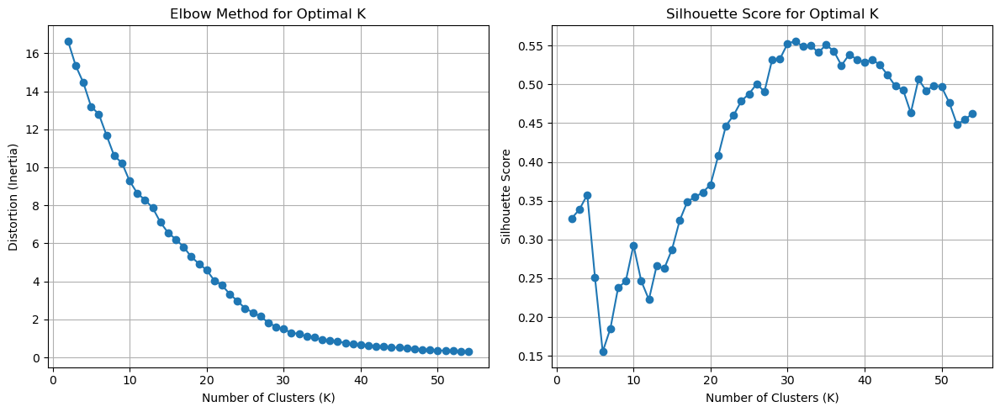

In [632]:
from sklearn.decomposition import NMF

def reduce_dimensionality(tfidf_vectors, n_components):
    nmf = NMF(n_components=n_components)
    reduced_jokes = nmf.fit_transform(tfidf_vectors)
    return reduced_jokes

def perform_clustering(reduced_jokes, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_assignments = kmeans.fit_predict(reduced_jokes)
    return cluster_assignments,kmeans

def calculate_silhouette_score(reduced_jokes, cluster_assignments):
    silhouette_avg = silhouette_score(reduced_jokes, cluster_assignments)
    return silhouette_avg


tfidf_vectors = TF_IDF_lemma
num_components = 30

reduced_jokes = reduce_dimensionality(tfidf_vectors, num_components)
find_optimal_k(reduced_jokes)


In [633]:
jokes_dataframe["Reduced_Lemmitized_Data"] = [i for i in reduced_jokes]

In [634]:
cluster_assignments,kmeans_Model = perform_clustering(reduced_jokes, 35)

silhouette_avg = calculate_silhouette_score(reduced_jokes, cluster_assignments)

print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.5395729880221958


In [635]:
jokes_dataframe["KMeans_Labels"] = [i for i in kmeans_Model.predict(reduced_jokes)]

In [636]:
jokes_id = [f"joke-{i}" for i in range(1,101)]
joke_cluster_id = list(jokes_dataframe["KMeans_Labels"])

In [637]:
cluster_joke_mapping = {i:[] for i in np.unique(joke_cluster_id)}

In [638]:
for joke_id,joke_cluster_id in zip(jokes_id, joke_cluster_id):
    cluster_joke_mapping[joke_cluster_id].append(joke_id)

In [639]:
cluster_joke_mapping

{0: ['joke-11', 'joke-52'],
 1: ['joke-1',
  'joke-22',
  'joke-59',
  'joke-61',
  'joke-64',
  'joke-68',
  'joke-72',
  'joke-81',
  'joke-83',
  'joke-87',
  'joke-88',
  'joke-95',
  'joke-99'],
 2: ['joke-28', 'joke-47', 'joke-49', 'joke-84'],
 3: ['joke-7', 'joke-17', 'joke-74', 'joke-85'],
 4: ['joke-2'],
 5: ['joke-48', 'joke-89'],
 6: ['joke-45', 'joke-92'],
 7: ['joke-77'],
 8: ['joke-40', 'joke-58', 'joke-90'],
 9: ['joke-27', 'joke-96'],
 10: ['joke-4', 'joke-20', 'joke-21', 'joke-73', 'joke-75', 'joke-78'],
 11: ['joke-31', 'joke-100'],
 12: ['joke-18', 'joke-60'],
 13: ['joke-5'],
 14: ['joke-9', 'joke-26', 'joke-36', 'joke-44', 'joke-86', 'joke-91'],
 15: ['joke-39', 'joke-42', 'joke-76'],
 16: ['joke-46', 'joke-55', 'joke-56', 'joke-82'],
 17: ['joke-23', 'joke-54'],
 18: ['joke-32', 'joke-63', 'joke-71'],
 19: ['joke-14', 'joke-50', 'joke-53', 'joke-67'],
 20: ['joke-41', 'joke-43', 'joke-94'],
 21: ['joke-25', 'joke-65', 'joke-70'],
 22: ['joke-6', 'joke-80'],
 23: [

In [640]:
import math
def FillNullValues(Data, cluster_mapping):

    ret_lst = []
    jokes = [f"joke-{i}" for i in range(1,101)]

    for index,rows in Data.iterrows():

        temp_lst = []
        rows = list(rows)

        for index,rating in enumerate(rows):
            value = rating
            if value is None or math.isnan(value) or value == float('inf') or value == float('-inf'):
                key_ = [key for key, values in cluster_mapping.items() if f"joke-{index+1}" in values][0]
                Jokes_Within_Same_Cluster = [int(id.split("-")[-1]) for id in cluster_mapping[key_]]
                
                ratings = [rows[i-1] for i in Jokes_Within_Same_Cluster if not (rows[i-1] is None or math.isnan(rows[i-1]) or rows[i-1] == float('inf') or rows[i-1] == float('-inf'))]

                if len(ratings) != 0:
                    value = np.mean(ratings)
                else:
                    value = np.nan

            temp_lst.append(value)
            
        ret_lst.append(temp_lst)


    return pd.DataFrame(ret_lst, columns=jokes)    

                


In [641]:
helper_frame = FillNullValues(dataframe.drop(columns=["Number of jokes rated"]),cluster_joke_mapping)

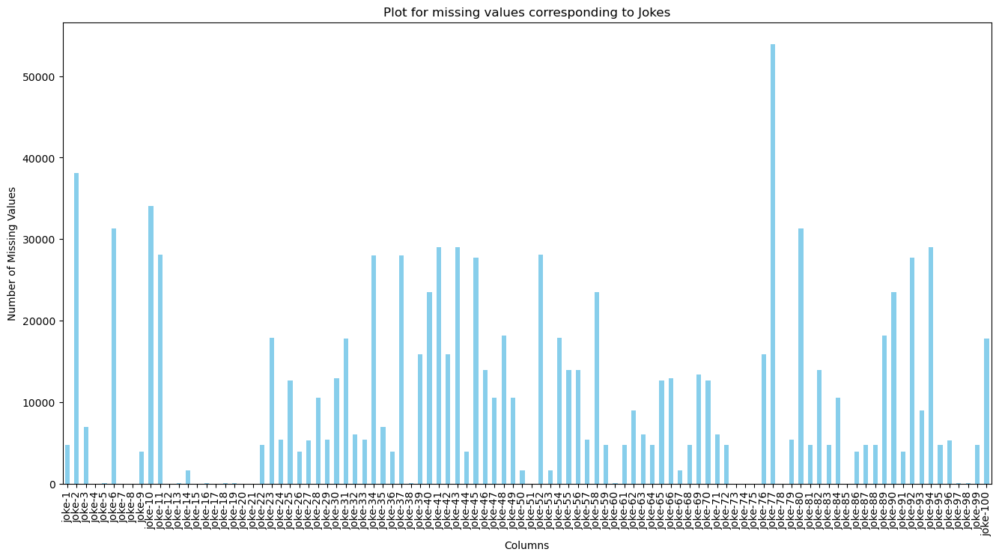

In [642]:
df = helper_frame

missing_values = df.isnull().sum()

plt.figure(figsize=(16, 8))
missing_values.plot(kind='bar', color='skyblue')
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.title('Plot for missing values corresponding to Jokes')
plt.xticks(rotation=90)
plt.show()

In [643]:
np.sum(dataframe.isnull().sum())

3205753

In [644]:
np.sum(helper_frame.isnull().sum())

1023148

So, by using the above-mentioned approach, we significantly reduced null values in our dataset, replacing roughly 200,000 null values.

In [645]:
helper_frame

,joke-1,joke-2,joke-3,joke-4,joke-5,joke-6,joke-7,joke-8,joke-9,joke-10,...,joke-91,joke-92,joke-93,joke-94,joke-95,joke-96,joke-97,joke-98,joke-99,joke-100
0,4.080000,-0.29,6.36,4.370,-2.38,-9.66,-0.73,-5.34,8.880,9.22,...,2.820,-4.95,-0.29,7.86,-0.190000,-2.14,3.06,0.34,-4.320000,1.07
1,6.870000,NaN,8.98,8.155,9.03,9.27,9.03,9.27,7.405,NaN,...,7.405,9.27,7.28,9.08,6.870000,7.28,9.03,-6.89,6.870000,6.17
2,1.650000,8.35,6.21,1.625,1.80,8.16,-2.82,6.21,4.780,1.84,...,4.780,NaN,-3.69,0.53,1.650000,3.93,-3.64,-6.65,1.650000,6.65
3,8.500000,4.61,-4.17,-5.390,1.36,1.60,7.04,4.61,-0.440,5.73,...,5.190,5.58,4.27,5.19,5.730000,1.55,3.11,6.55,1.800000,1.60
4,-6.170000,-3.54,0.44,-8.500,-7.09,-4.32,-8.69,-0.87,-6.650,-1.80,...,-3.540,-6.89,-0.68,-2.96,-2.180000,-3.35,0.05,-9.08,-5.050000,-3.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73413,7.910000,NaN,NaN,NaN,5.78,8.45,9.81,8.20,NaN,8.50,...,NaN,9.95,NaN,8.54,7.910000,NaN,10.00,8.30,7.910000,NaN
73414,NaN,NaN,NaN,-1.650,5.24,NaN,0.39,5.68,NaN,NaN,...,NaN,NaN,9.81,8.40,NaN,NaN,0.68,-3.20,NaN,NaN
73415,1.633333,NaN,-8.69,4.635,-3.93,NaN,-9.03,-2.67,8.790,NaN,...,8.790,NaN,3.50,NaN,1.633333,-3.01,0.78,-9.66,1.633333,0.68
73416,7.520000,NaN,NaN,8.105,9.42,9.66,4.08,9.17,NaN,NaN,...,NaN,NaN,NaN,NaN,7.520000,8.83,9.81,5.97,7.520000,NaN


Iterative Imputer is a valuable tool for handling missing data in datasets. It allows you to maintain data integrity by replacing missing values with reasonable estimates. This is important for preserving valuable information, enhancing predictive models, and reducing dimensionality. The iterative approach considers relationships between variables and is effective when missing values depend on other factors.

In [646]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='median')

imputed_data = imputer.fit_transform(helper_frame)

imputed_data = pd.DataFrame(imputed_data, columns=helper_frame.columns)


In [647]:
temp_frame = imputed_data

In [648]:
imputed_data

,joke-1,joke-2,joke-3,joke-4,joke-5,joke-6,joke-7,joke-8,joke-9,joke-10,...,joke-91,joke-92,joke-93,joke-94,joke-95,joke-96,joke-97,joke-98,joke-99,joke-100
0,4.080000,-0.29,6.36,4.370,-2.38,-9.66,-0.73,-5.34,8.880,9.22,...,2.820,-4.95,-0.29,7.860,-0.190000,-2.14,3.06,0.34,-4.320000,1.07
1,6.870000,0.73,8.98,8.155,9.03,9.27,9.03,9.27,7.405,1.84,...,7.405,9.27,7.28,9.080,6.870000,7.28,9.03,-6.89,6.870000,6.17
2,1.650000,8.35,6.21,1.625,1.80,8.16,-2.82,6.21,4.780,1.84,...,4.780,1.55,-3.69,0.530,1.650000,3.93,-3.64,-6.65,1.650000,6.65
3,8.500000,4.61,-4.17,-5.390,1.36,1.60,7.04,4.61,-0.440,5.73,...,5.190,5.58,4.27,5.190,5.730000,1.55,3.11,6.55,1.800000,1.60
4,-6.170000,-3.54,0.44,-8.500,-7.09,-4.32,-8.69,-0.87,-6.650,-1.80,...,-3.540,-6.89,-0.68,-2.960,-2.180000,-3.35,0.05,-9.08,-5.050000,-3.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73413,7.910000,0.73,2.23,-0.440,5.78,8.45,9.81,8.20,1.290,8.50,...,1.940,9.95,3.20,8.540,7.910000,3.16,10.00,8.30,7.910000,2.33
73414,1.650000,0.73,2.23,-1.650,5.24,1.89,0.39,5.68,1.290,1.84,...,1.940,1.55,9.81,8.400,1.440000,3.16,0.68,-3.20,1.140000,2.33
73415,1.633333,0.73,-8.69,4.635,-3.93,1.89,-9.03,-2.67,8.790,1.84,...,8.790,1.55,3.50,0.365,1.633333,-3.01,0.78,-9.66,1.633333,0.68
73416,7.520000,0.73,2.23,8.105,9.42,9.66,4.08,9.17,1.290,1.84,...,1.940,1.55,3.20,0.365,7.520000,8.83,9.81,5.97,7.520000,2.33


Pattern Finding and Data Visualization

In [649]:
EDA_Frame = temp_frame
Rating_Threshold = np.mean(EDA_Frame.mean())
GoodJokes = EDA_Frame.mean()[EDA_Frame.mean() >= Rating_Threshold]
BadJokes = EDA_Frame.mean()[EDA_Frame.mean() < Rating_Threshold]

In [650]:
good_jokes = []
for joke_id, mean_rating in GoodJokes.iteritems():
    good_jokes.append(Jokes[int(joke_id.split('-')[-1]) - 1])

bad_jokes = []
for joke_id, mean_rating in BadJokes.iteritems():
    bad_jokes.append(Jokes[int(joke_id.split('-')[-1]) - 1])

In [651]:
def create_word_cloud(text_list, width=800, height=400):
    text = ' '.join(text_list)

    wordcloud = WordCloud(width=width, height=height, background_color='white').generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

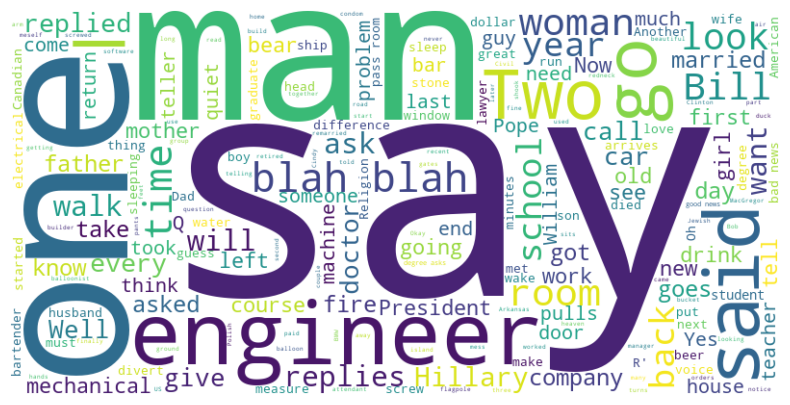

In [652]:
create_word_cloud(good_jokes)

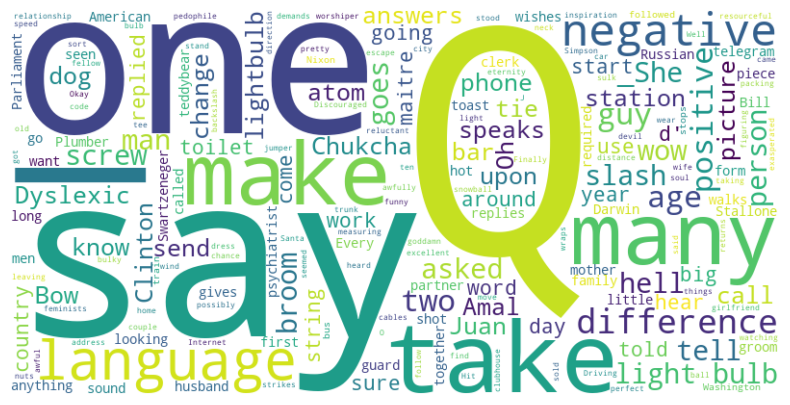

In [653]:
create_word_cloud(bad_jokes)

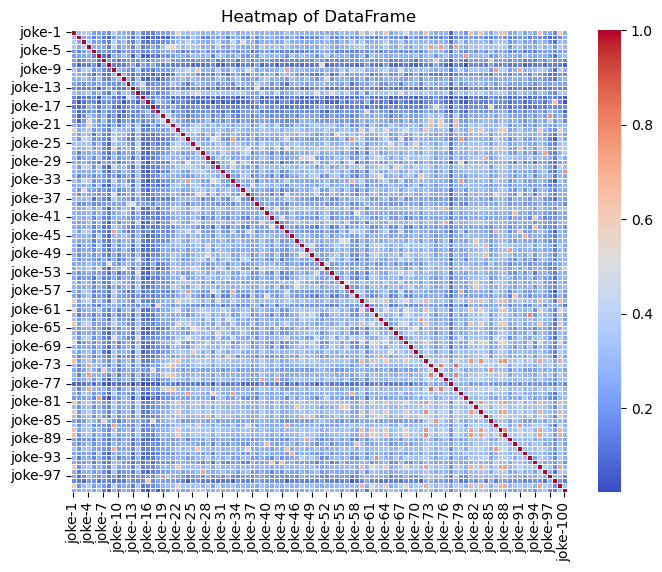

In [654]:
df = EDA_Frame.corr()

plt.figure(figsize=(8, 6))
seaborn.heatmap(df, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title("Heatmap of DataFrame")
plt.show()

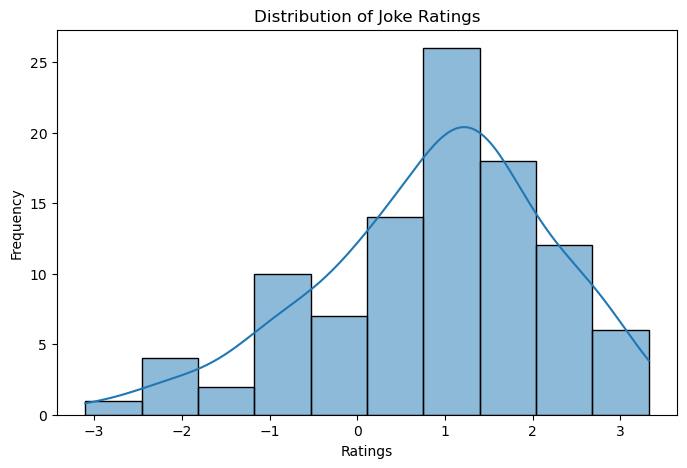

In [655]:
plt.figure(figsize=(8, 5))
seaborn.histplot(EDA_Frame.mean(), bins=10, kde=True)
plt.title('Distribution of Joke Ratings')
plt.xlabel('Ratings')
plt.ylabel('Frequency')
plt.show()

In [656]:
mean_ratings = list(EDA_Frame.mean())
max_rating_index = mean_ratings.index(max(mean_ratings))
min_rating_index = mean_ratings.index(min(mean_ratings))
print("Joke with on an average Max rating: \n")
print(Jokes[max_rating_index])

Joke with on an average Max rating: 

A guy goes into confession and says to the priest, "Father, I'm 80 years old,
widower, with 11 grandchildren. Last night I met two beautiful flight
attendants. They took me home and I made love to both of them. Twice."

The priest said: "Well, my son, when was the last time you were in
confession?"

"Never Father, I'm Jewish."

"So then, why are you telling me?"

"I'm telling everybody."


In [657]:
print("Joke with on an average Min rating: \n")

print(Jokes[min_rating_index])

Joke with on an average Min rating: 

Q. What is orange and sounds like a parrot?  
  
A. A carrot.


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_43484\627596331.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 5))


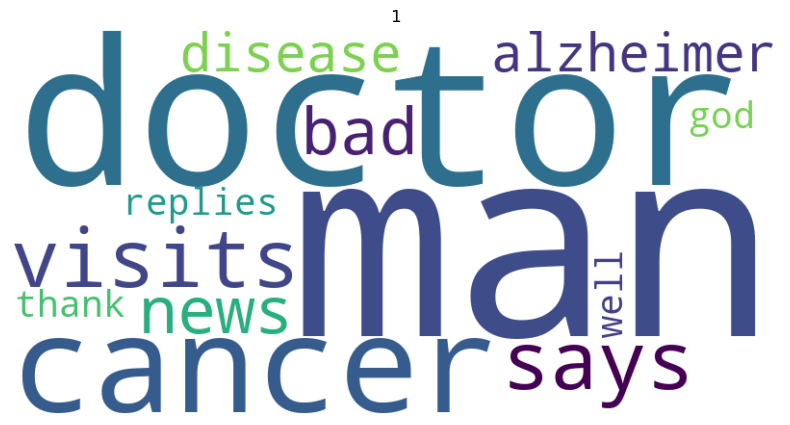

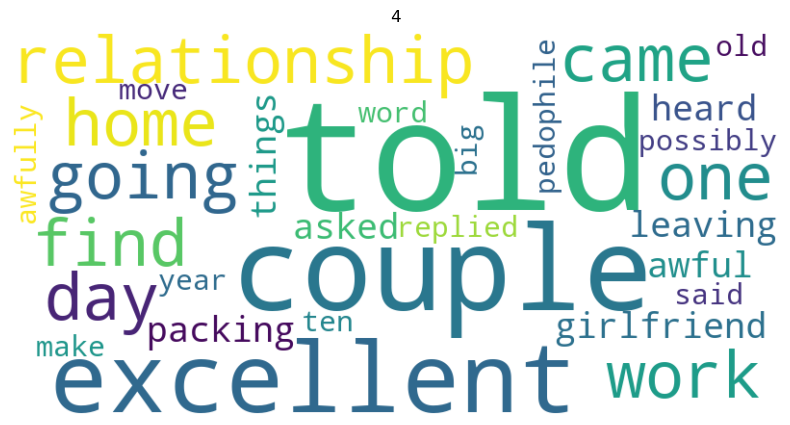

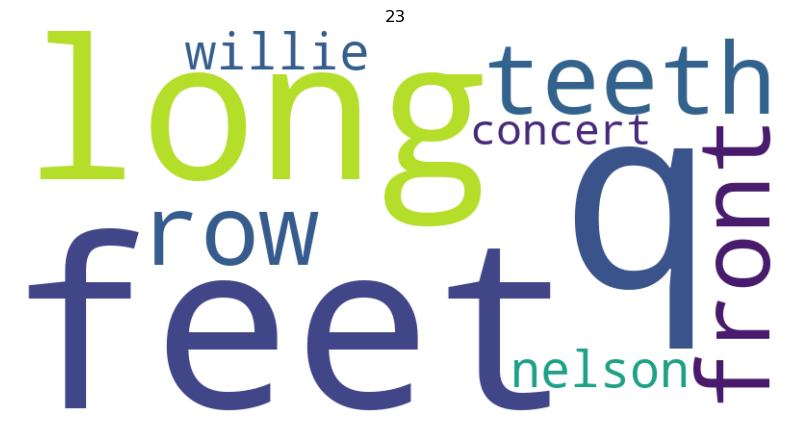

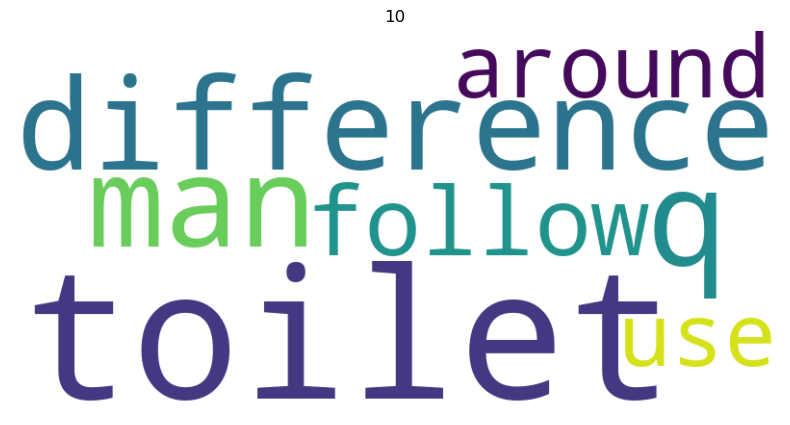

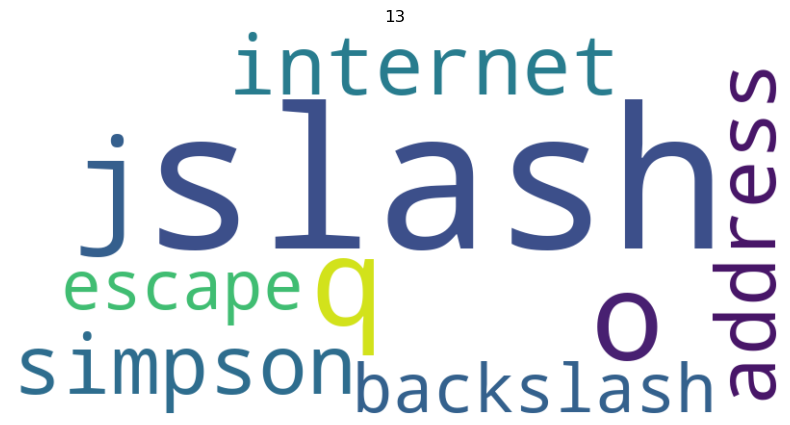

...

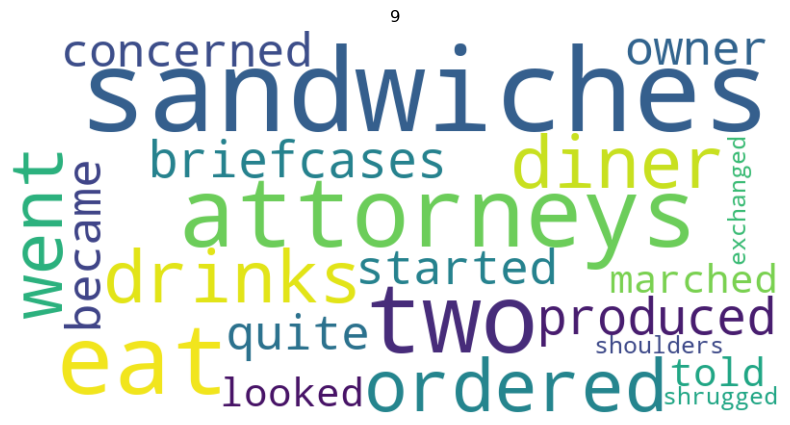

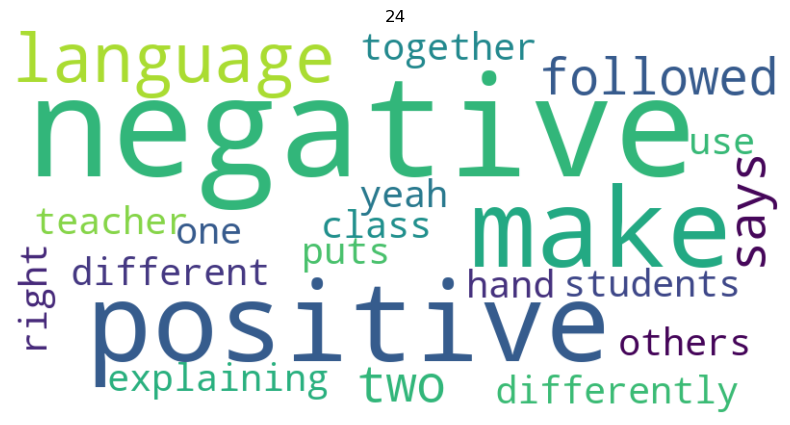

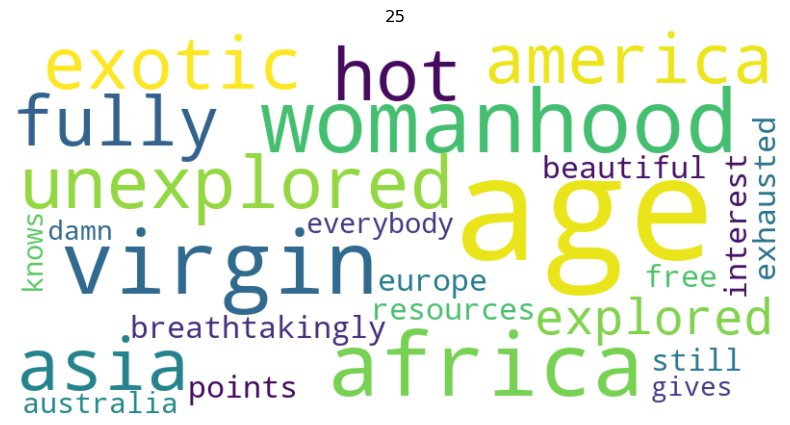

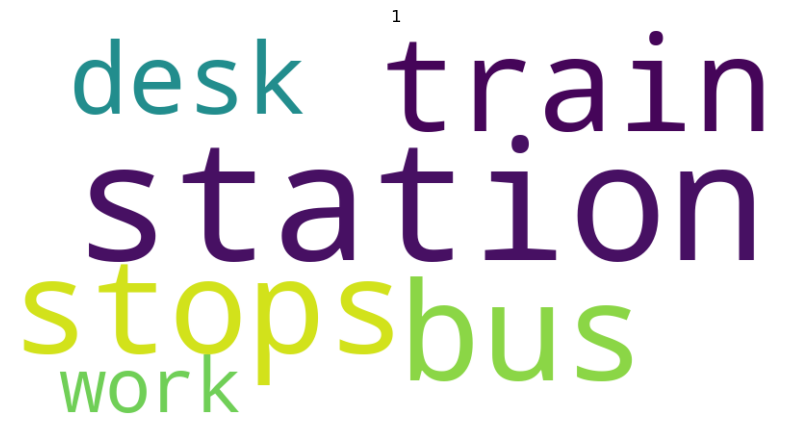

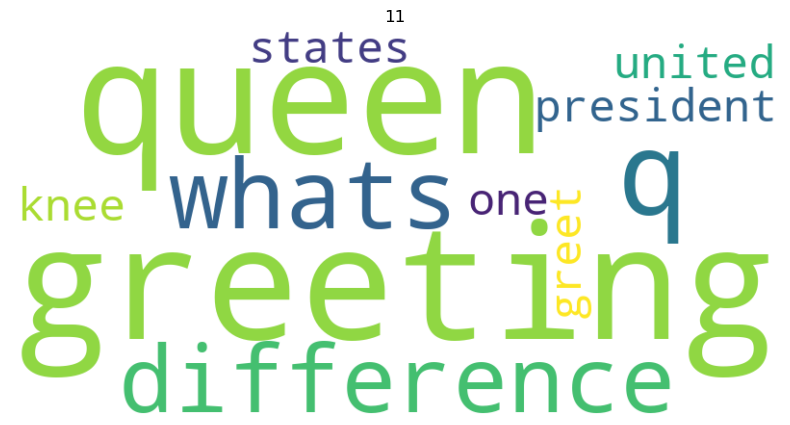

In [658]:
clustered_jokes = jokes_dataframe["PreProcessed Jokes"]
cluster_labels = jokes_dataframe["KMeans_Labels"]

for cluster_text, cluster_label in zip(clustered_jokes, cluster_labels):
    
    cluster_text = " ".join(cluster_text)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cluster_text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(cluster_label)
    plt.axis("off")

plt.show()


In [659]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

def apply_Hierarchial(data):

    cluster_range = range(2, 50)

    silhouette_scores = []

    for n_clusters in cluster_range:
        hierarchical = AgglomerativeClustering(n_clusters=n_clusters)
        labels = hierarchical.fit_predict(data)
        
        silhouette = silhouette_score(data, labels)
        silhouette_scores.append(silhouette)

    plt.plot(cluster_range, silhouette_scores, marker='o')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Scores for Hierarchical Clustering')
    plt.show()

    return max(silhouette_scores), silhouette_scores.index(max(silhouette_scores)) + 2


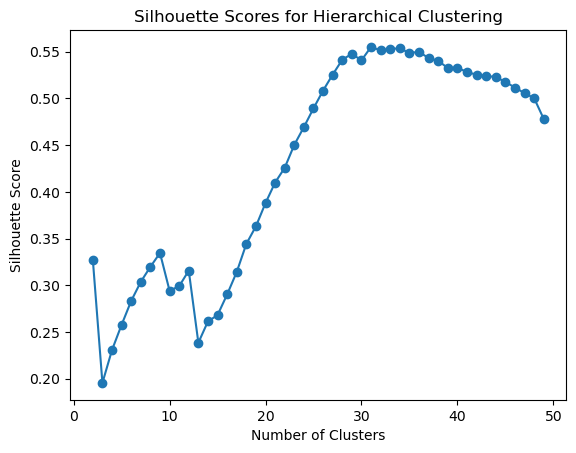

(0.554971930300592, 31)

In [660]:
apply_Hierarchial(reduced_jokes)

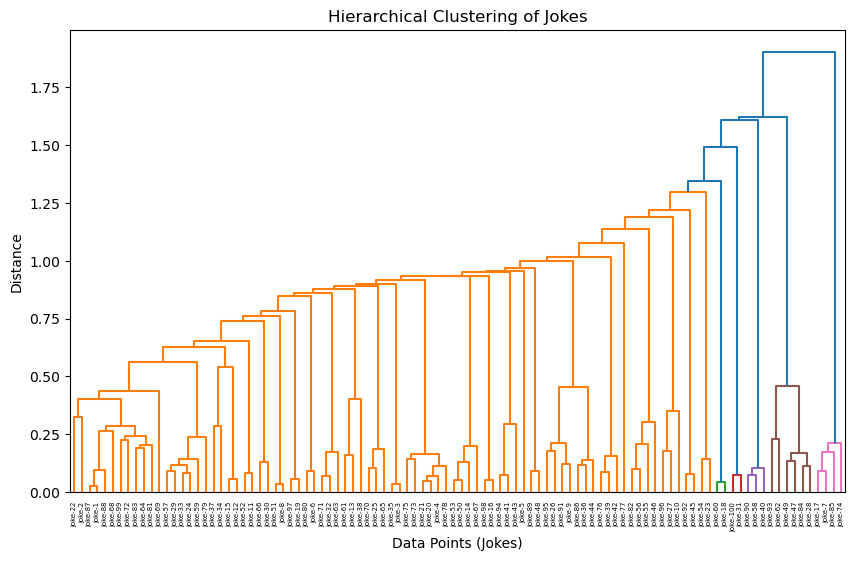

In [661]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

hierarchical = AgglomerativeClustering(n_clusters=37)
labels = hierarchical.fit_predict(reduced_jokes)

linkage_matrix = linkage(reduced_jokes, method='ward')

data_point_labels = [f'joke-{i}' for i in range(1,101)]

plt.figure(figsize=(10, 6))
dendrogram(linkage_matrix, orientation='top', labels=data_point_labels, distance_sort='descending')
plt.title('Hierarchical Clustering of Jokes')
plt.xlabel('Data Points (Jokes)')
plt.ylabel('Distance')
plt.show()

In [662]:
jokes_dataframe["Hierarchial Labels"] = labels

In [663]:
import spacy
import textstat

nlp = spacy.load("en_core_web_sm")

def calculate_text_statistics(jokes):

    statistics = {
        "Text Length": [],
        "Punctuation Count": [],
        "Word Count": [],
        "Unique Word Count": [],
        "Average Word Length": [],
        "Stopword Count": [],
        "Verb Count": [],
        "Noun Count": [],
        "Adjective Count": [],
        "Adverb Count": [],
        "Readability Score": [],
    }

    for input_text in jokes: 

        text_length = len(input_text)
        
        doc = nlp(input_text)

        punctuation_count = sum(1 for token in doc if token.is_punct)

        word_count = len(doc)

        unique_words = set(token.text.lower() for token in doc if token.is_alpha)
        unique_word_count = len(unique_words)

        total_word_length = sum(len(token.text) for token in doc if token.is_alpha)
        average_word_length = total_word_length / word_count if word_count > 0 else 0

        stopwords = sum(1 for token in doc if token.is_stop)

        verb_count = sum(1 for token in doc if token.pos_ == "VERB")
        noun_count = sum(1 for token in doc if token.pos_ == "NOUN")
        adjective_count = sum(1 for token in doc if token.pos_ == "ADJ")
        adverb_count = sum(1 for token in doc if token.pos_ == "ADV")
        conjunction_count = sum(1 for token in doc if token.pos_ == "CONJ")

        readability_score = textstat.flesch_kincaid_grade(input_text)

        statistics["Text Length"].append(text_length)
        statistics["Punctuation Count"].append(punctuation_count)
        statistics["Word Count"].append(word_count)
        statistics["Unique Word Count"].append(unique_word_count)
        statistics["Average Word Length"].append(average_word_length)
        statistics["Verb Count"].append(verb_count)
        statistics["Noun Count"].append(noun_count)
        statistics["Adjective Count"].append(adjective_count)
        statistics["Adverb Count"].append(adverb_count)
        statistics["Readability Score"].append(readability_score)
        statistics["Stopword Count"].append(stopwords)


    return pd.DataFrame(statistics)

In [664]:
stastistcal_features = calculate_text_statistics(list(jokes_dataframe["Original Jokes"]))

In [665]:
stastistcal_features["Mean Rating"] = mean_ratings

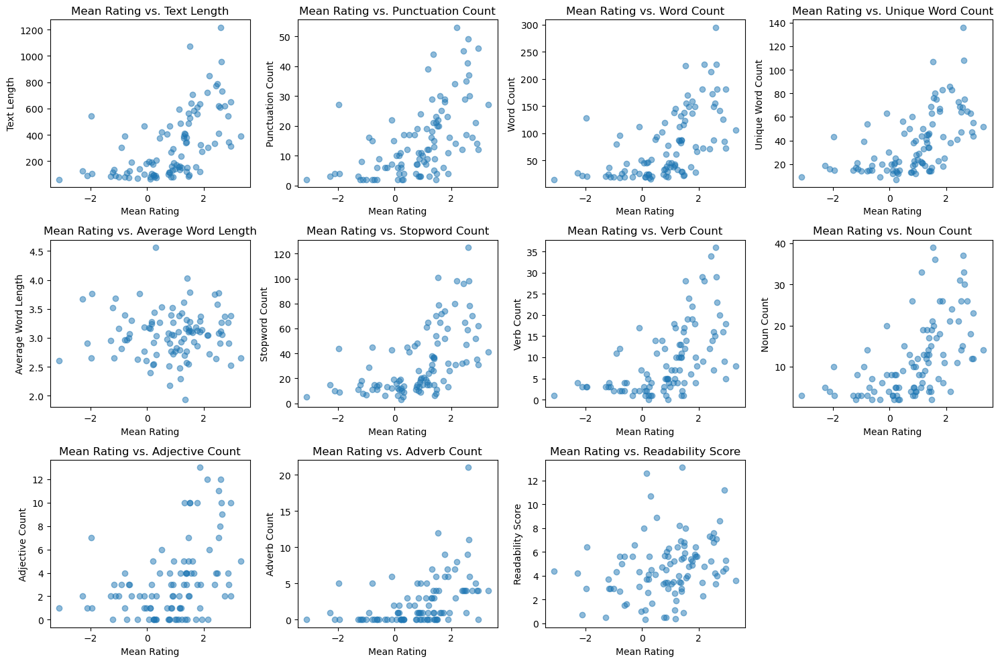

In [666]:
import matplotlib.pyplot as plt

other_columns = [col for col in stastistcal_features.columns if col != 'Mean Rating']

num_columns = 4
num_rows = (len(other_columns) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 10))

axes = axes.flatten()

for i, column in enumerate(other_columns):
    ax = axes[i]
    ax.scatter(stastistcal_features['Mean Rating'], stastistcal_features[column], alpha=0.5)
    ax.set_title(f'Mean Rating vs. {column}')
    ax.set_xlabel('Mean Rating')
    ax.set_ylabel(column)
    ax.grid(False)

for i in range(len(other_columns), num_rows * num_columns):
    fig.delaxes(axes[i])

fig.tight_layout()

plt.show()


EDA based upon users ratings

In [667]:
def plot_statistical_features(features, names,Feature_Name):
    plt.figure(figsize=(20, 16))
    plt.scatter(range(1, len(features) + 1), features, marker='o', color='skyblue')
    
    # Adjust the rotation angle and label skipping
    plt.xticks(range(1, len(features) + 1), rotation=45)
    
    plt.xlabel('Jokes')
    plt.ylabel(Feature_Name)
    plt.xticks(rotation=90)
    plt.grid(False)
    plt.show()


In [668]:
temp_frame = imputed_data

In [669]:
imputed_data

,joke-1,joke-2,joke-3,joke-4,joke-5,joke-6,joke-7,joke-8,joke-9,joke-10,...,joke-91,joke-92,joke-93,joke-94,joke-95,joke-96,joke-97,joke-98,joke-99,joke-100
0,4.080000,-0.29,6.36,4.370,-2.38,-9.66,-0.73,-5.34,8.880,9.22,...,2.820,-4.95,-0.29,7.860,-0.190000,-2.14,3.06,0.34,-4.320000,1.07
1,6.870000,0.73,8.98,8.155,9.03,9.27,9.03,9.27,7.405,1.84,...,7.405,9.27,7.28,9.080,6.870000,7.28,9.03,-6.89,6.870000,6.17
2,1.650000,8.35,6.21,1.625,1.80,8.16,-2.82,6.21,4.780,1.84,...,4.780,1.55,-3.69,0.530,1.650000,3.93,-3.64,-6.65,1.650000,6.65
3,8.500000,4.61,-4.17,-5.390,1.36,1.60,7.04,4.61,-0.440,5.73,...,5.190,5.58,4.27,5.190,5.730000,1.55,3.11,6.55,1.800000,1.60
4,-6.170000,-3.54,0.44,-8.500,-7.09,-4.32,-8.69,-0.87,-6.650,-1.80,...,-3.540,-6.89,-0.68,-2.960,-2.180000,-3.35,0.05,-9.08,-5.050000,-3.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73413,7.910000,0.73,2.23,-0.440,5.78,8.45,9.81,8.20,1.290,8.50,...,1.940,9.95,3.20,8.540,7.910000,3.16,10.00,8.30,7.910000,2.33
73414,1.650000,0.73,2.23,-1.650,5.24,1.89,0.39,5.68,1.290,1.84,...,1.940,1.55,9.81,8.400,1.440000,3.16,0.68,-3.20,1.140000,2.33
73415,1.633333,0.73,-8.69,4.635,-3.93,1.89,-9.03,-2.67,8.790,1.84,...,8.790,1.55,3.50,0.365,1.633333,-3.01,0.78,-9.66,1.633333,0.68
73416,7.520000,0.73,2.23,8.105,9.42,9.66,4.08,9.17,1.290,1.84,...,1.940,1.55,3.20,0.365,7.520000,8.83,9.81,5.97,7.520000,2.33


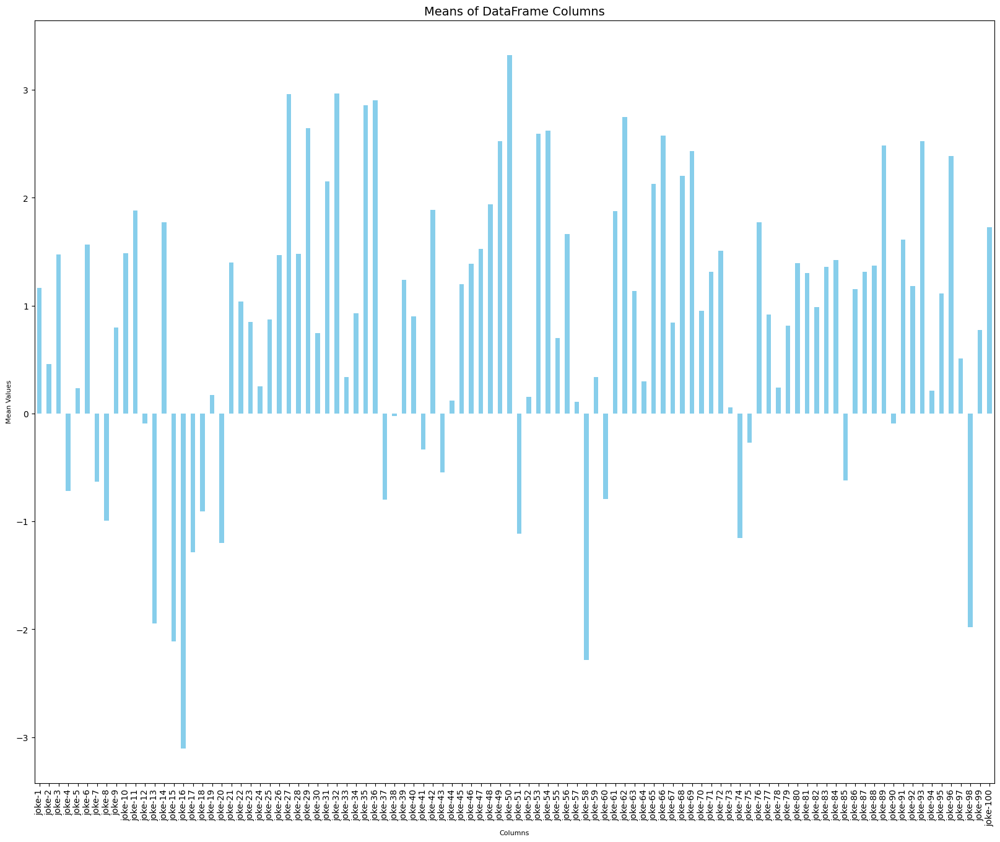

In [670]:
column_means = temp_frame.mean()

plt.figure(figsize=(20, 16))
column_means.plot(kind='bar', color='skyblue')
plt.xlabel('Columns', fontsize=8)
plt.ylabel('Mean Values', fontsize=8)
plt.title('Means of DataFrame Columns', fontsize=14)
plt.xticks(rotation=90)
plt.show()

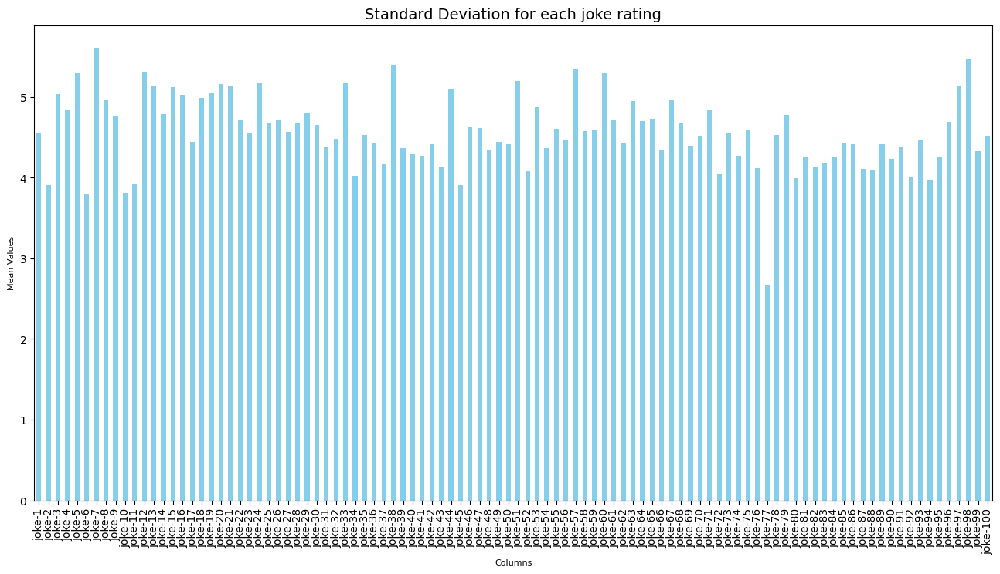

In [671]:
column_means = temp_frame.std()

plt.figure(figsize=(16, 8))
column_means.plot(kind='bar', color='skyblue')
plt.xlabel('Columns', fontsize=8)
plt.ylabel('Mean Values', fontsize=8)
plt.title('Standard Deviation for each joke rating', fontsize=14)
plt.xticks(rotation=90)
plt.show()

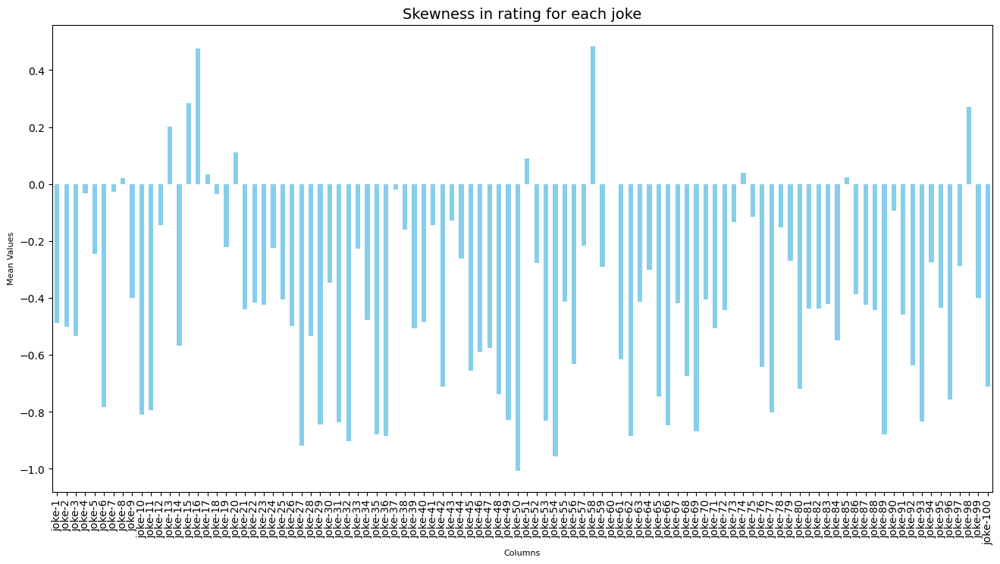

In [672]:
column_means = temp_frame.skew()

plt.figure(figsize=(16, 8))
column_means.plot(kind='bar', color='skyblue')
plt.xlabel('Columns', fontsize=8)
plt.ylabel('Mean Values', fontsize=8)
plt.title('Skewness in rating for each joke', fontsize=14)
plt.xticks(rotation=90)
plt.show()

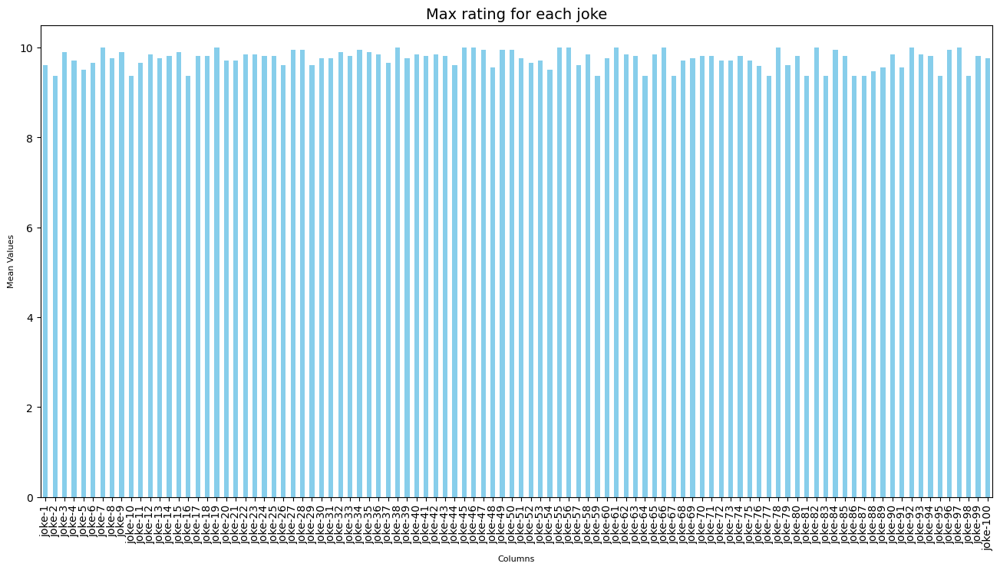

In [673]:
column_means = temp_frame.max()

plt.figure(figsize=(16, 8))
column_means.plot(kind='bar', color='skyblue')
plt.xlabel('Columns', fontsize=8)
plt.ylabel('Mean Values', fontsize=8)
plt.title('Max rating for each joke', fontsize=14)
plt.xticks(rotation=90)
plt.show()


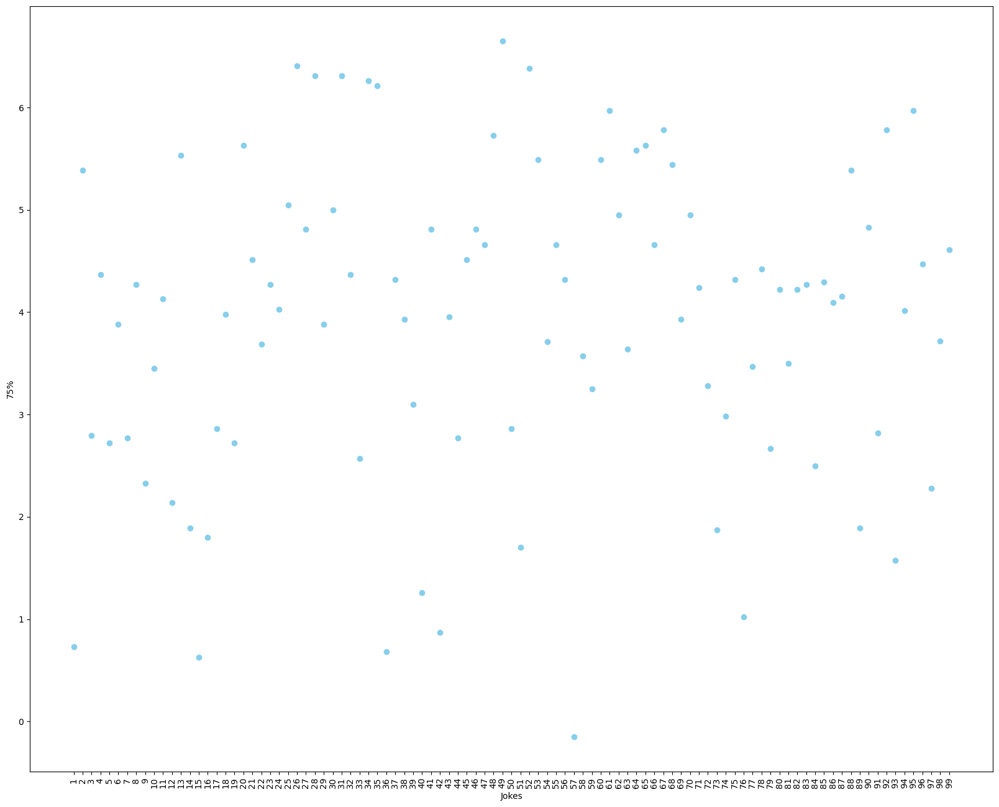

In [674]:
plot_statistical_features(list(temp_frame.describe().loc['75%'])[1:],list(dataframe.columns)[1:],"75%")

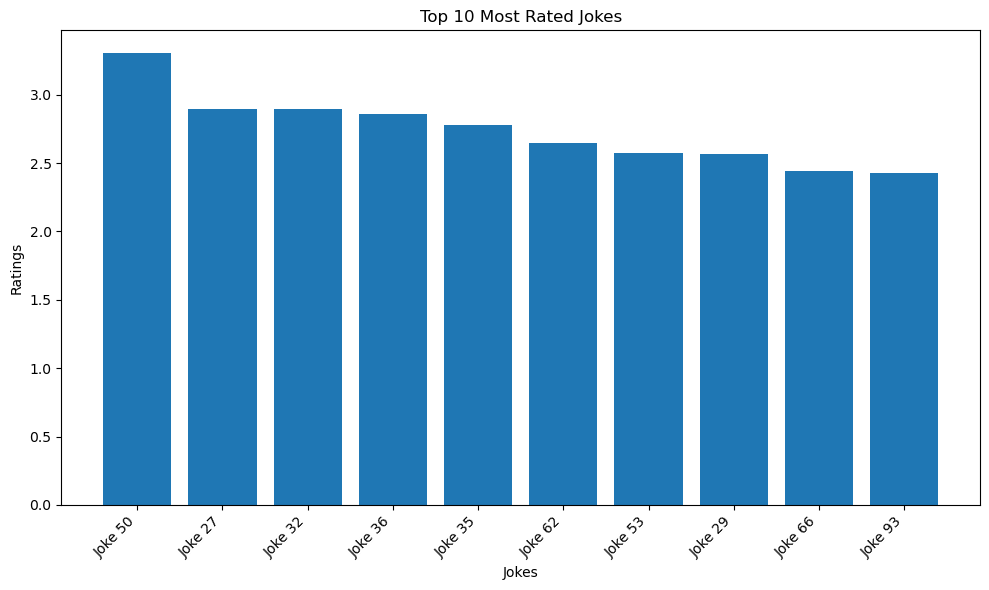

In [675]:
jokes_data = [(f"Joke {index+1}", i) for index,i in enumerate(helper_frame.mean())]
sorted_jokes = sorted(jokes_data, key=lambda x: x[1], reverse=True)
top_10_jokes = sorted_jokes[:10]

joke_names, ratings = zip(*top_10_jokes)

plt.figure(figsize=(10, 6))
plt.bar(range(10), ratings, tick_label=joke_names)
plt.xlabel('Jokes')
plt.ylabel('Ratings')
plt.title('Top 10 Most Rated Jokes')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

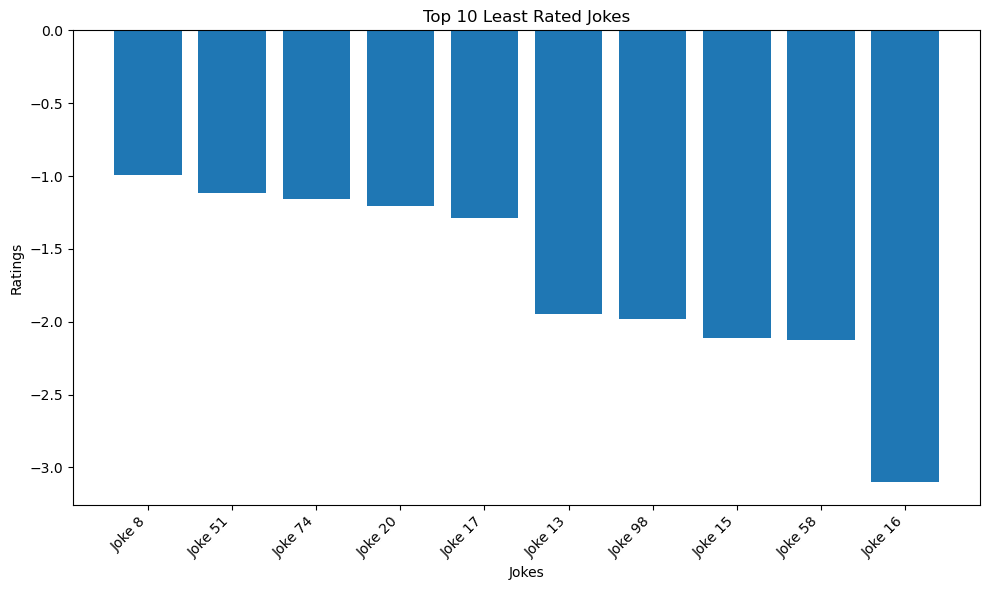

In [676]:
top_10_jokes = sorted_jokes[-10:]

joke_names, ratings = zip(*top_10_jokes)

plt.figure(figsize=(10, 6))
plt.bar(range(10), ratings, tick_label=joke_names)
plt.xlabel('Jokes')
plt.ylabel('Ratings')
plt.title('Top 10 Least Rated Jokes')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

In [677]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

df_standardized = pd.DataFrame(scaler.fit_transform(temp_frame), columns=df.columns)


In [678]:
def kmeans_elbow_silhouette(data, max_clusters=10):
    distortion = []
    silhouette_scores = []

    for k in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        distortion.append(kmeans.inertia_) 
        if k > 1:
            silhouette_scores.append(silhouette_score(data, kmeans.labels_))

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, max_clusters + 1), distortion, marker='o')
    plt.title('Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')

    plt.subplot(1, 2, 2)
    plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
    plt.title('Silhouette Score')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Score')

    plt.tight_layout()
    plt.show()

    return distortion, silhouette_scores

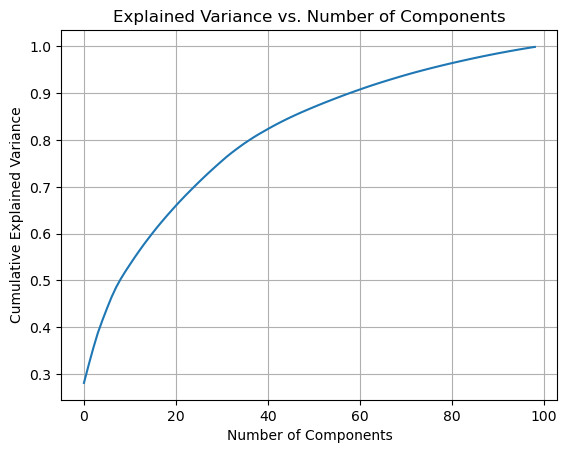

In [679]:
from sklearn.decomposition import TruncatedSVD

data = df_standardized.to_numpy()

svd = TruncatedSVD(n_components=data.shape[1]-1, random_state=42)  

svd.fit(data)

explained_var_ratio = svd.explained_variance_ratio_

plt.plot(np.cumsum(explained_var_ratio))
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Explained Variance vs. Number of Components")
plt.grid()
plt.show()


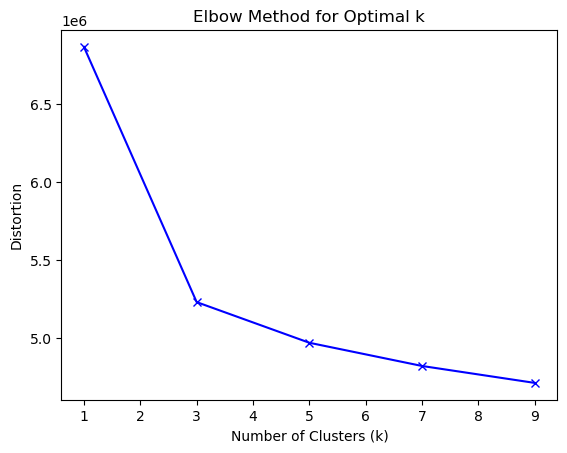

In [680]:
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans

data = df_standardized.to_numpy()

n_components = 70  
svd = TruncatedSVD(n_components=n_components, random_state=42)
reduced_data = svd.fit_transform(data)

distortions = []
K = range(1, 11,2)  
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(reduced_data)
    distortions.append(kmeans.inertia_)

plt.plot(K, distortions, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Distortion')
plt.title('Elbow Method for Optimal k')
plt.show()



So from the elbow plot the optimal Number of clusters are are 3 for given dataset after reduction using TruncatedSVD

In [681]:
user_segmentation = KMeans(n_clusters=3,random_state=42,algorithm="auto")
user_segmentation.fit(reduced_data)

KMeans(n_clusters=3, random_state=42)

In [682]:
Labels = user_segmentation.predict(reduced_data)

In [683]:
temp_frame = imputed_data

In [684]:
temp_frame["Cluster Labels"] = Labels

In [685]:
Grouped_Frame = temp_frame.groupby("Cluster Labels")

In [686]:
user_most_rated_item_dict = {}

def top_columns_with_most_values_above_threshold(dataframe, threshold=6, num_columns=15):
    count_df = (dataframe > threshold).sum()

    sorted_columns = count_df.sort_values(ascending=False)

    top_columns = sorted_columns.head(num_columns)

    return top_columns.index

for cluster_id, grouped_Data in Grouped_Frame:
        grouped_Data.drop(columns=["Cluster Labels"], inplace=True)

        user_most_rated_item_dict[cluster_id] = top_columns_with_most_values_above_threshold(grouped_Data)

In [687]:
from collections import Counter


def most_common_words_in_dict(dictionary, top_n=3):
    combined_text = ' '.join(' '.join(value) for value in dictionary.values())

    words = combined_text.split()

    word_counts = Counter(words)

    most_common_words = word_counts.most_common(top_n)

    return most_common_words

In [688]:
for val, data__ in Grouped_Frame:
    data__.drop(columns=["Cluster Labels"], inplace=True)
    print(top_columns_with_most_values_above_threshold(data__,threshold=+6,num_columns=1))

Index(['joke-50'], dtype='object')
Index(['joke-50'], dtype='object')
Index(['joke-50'], dtype='object')


The most rated joke in each cluster in: 
    
    Joke-50:
    
        A guy goes into confession and says to the priest, "Father, I'm 80 years
        old, widower, with 11 grandchildren. Last night I met two beautiful flight
        attendants. They took me home and I made love to both of them. Twice."
        The priest said: "Well, my son, when was the last time you were in
        confession?"
        "Never Father, I'm Jewish."
        "So then, why are you telling me?"
        "I'm telling everybody.
        

In [689]:
most_common_words_in_dict(dictionary=user_most_rated_item_dict)

[('joke-50', 3), ('joke-29', 3), ('joke-27', 3)]

Based upon above clustering, top three most liked jokes In above three groups are: 

    joke-50

        A guy goes into confession and says to the priest, "Father, I'm 80 years
        old, widower, with 11 grandchildren. Last night I met two beautiful flight
        attendants. They took me home and I made love to both of them. Twice."
        The priest said: "Well, my son, when was the last time you were in
        confession?"
        "Never Father, I'm Jewish."
        "So then, why are you telling me?"
        "I'm telling everybody.

    joke-27
        
        Clinton returns from a vacation in Arkansas and walks down  the
        steps of Air Force One with two pigs under his arms.  At the bottom
        of the steps, he says  to the honor guardsman, "These are genuine
        Arkansas Razor-Back Hogs.  I got this one for Chelsea and this one for
        Hillary.

    joke-53
        One Sunday morning William burst into the living room and said,
        "Dad! Mom! I have some great news for you! I am getting married
        to the most beautiful girl in town. She lives a block away and
        her name is Susan."
        After dinner, William's dad took him aside. "Son, I have to talk
        with you. Your mother and I have been married 30 years.. She's a
        wonderful wife but she has never offered much excitement in the
        bedroom, so I used to fool around with women a lot. Susan is
        actually your half-sister, and I'm afraid you can't marry her."
        William was heart-broken. After eight months he eventually
        started dating girls again. A year later he came home and very
        proudly announced, "Dianne said yes! We're getting married in
        June."
        Again his father insisted on another private conversation and
        broke the sad news. "Dianne is your half-sister too, William. I'm
        awfully sorry about this."
        William was furious! He finally decided to go to his mother with
        the news.
        "Dad has done so much harm.. I guess I'm never going to get
        married,"  he complained. "Every time I fall in love, Dad tells
        me the girl is my half-sister."
        His mother just shook her head. "Don't pay any attention to what
        he says, dear. He's not really your father."


In [690]:
for val, data__ in Grouped_Frame:
    data__.drop(columns=["Cluster Labels"], inplace=True)
    print(top_columns_with_most_values_above_threshold(data__,threshold=-7,num_columns=1))

Index(['joke-77'], dtype='object')
Index(['joke-72'], dtype='object')
Index(['joke-72'], dtype='object')


So the least rated joke in each cluster is:

    joke-72: for cluster 1

        On the first day of college, the Dean addressed the students,
        pointing out some of the rules:

        "The female dormitory will be out-of-bounds for all male students
        and the male dormitory to the female students. Anybody caught breaking
        this rule will be finded $20 the first time." He continued, "Anybody 
        caught breaking this rule the second time will be fined $60. Being caught
        a third time will cost you a fine of $180. Are there any questions ?"
        At this point, a male student in the crowd inquired:
        "How much for a season pass ?"


    joke-81: for cluster 2

        An Asian man goes into a New York CityBank to exchange 10,000 yen for
        American Currency.  The teller gives him $72.00.  The next month the
        Asian man goes into the same bank with 10,000 yen and receives $62.00.
        He asks, "How come? Only $62.00?" The teller says "Fluctuations-
        Fluctuations!"

        Whereupon the Asian man looks back at the teller and says "Fluk you
        Amelicans too!"


    joke-88: for cluster 3

        A Czechoslovakian man felt his eyesight was growing steadily worse, and 
        felt it was time to go see an optometrist. 

        The doctor started with some simple testing, and showed him a standard eye 
        chart with letters of
        diminishing size: CRKBNWXSKZY. . . 
        "Can you read this?" the doctor asked. 
        "Read it?" the Czech answered."Doc, I know him!"


